## Dolomiti's ski runs and ski lifts analysis

Dolomiti mountains are a popular destination for skiers. On the province of Bolzano's [Geoportal](http://geocatalogo.retecivica.bz.it/geokatalog/#!home) you can find georeferenced data on both ski runs and ski lifts. On the other hand, on [OpenStreetMap](https://www.openstreetmap.org/#map=19/46.07224/11.11885) we can easily find the coordinates of tourist accommodation in the province's Dolomiti area.

![](https://www.powderhounds.com/site/DefaultSite/filesystem/images/Europe/Italy/Dolomites/dolomititrailmap.jpg)

### Set up

In [147]:
import geopandas as gpd
import contextily as ctx
import pandas as pd
import matplotlib.pyplot as plt
import osmnx  as ox
import pyrosm
import folium
from functions import *

### Import Dolomiti's and province of Bolzano GeoDataFrames

In [148]:
province_BZ = load_province('Bolzano', 'data\Limiti01012021_g\ProvCM01012021_g')
geodf_dolomities = load_geodf_dolomities('data\I nove Sistemi delle Dolomiti UNESCO.kml')
dolomities_BZ_clipped = lead_province_clipped_dolomiti('Bolzano', 'data\Limiti01012021_g')
geo_dolomiti_BZ_mun = load_province_dolomiti_mun(21, 'data\Limiti01012021_g')

Plot Dolomiti's municipalities area (the area we will be dealing with in this exploration):

<AxesSubplot:>

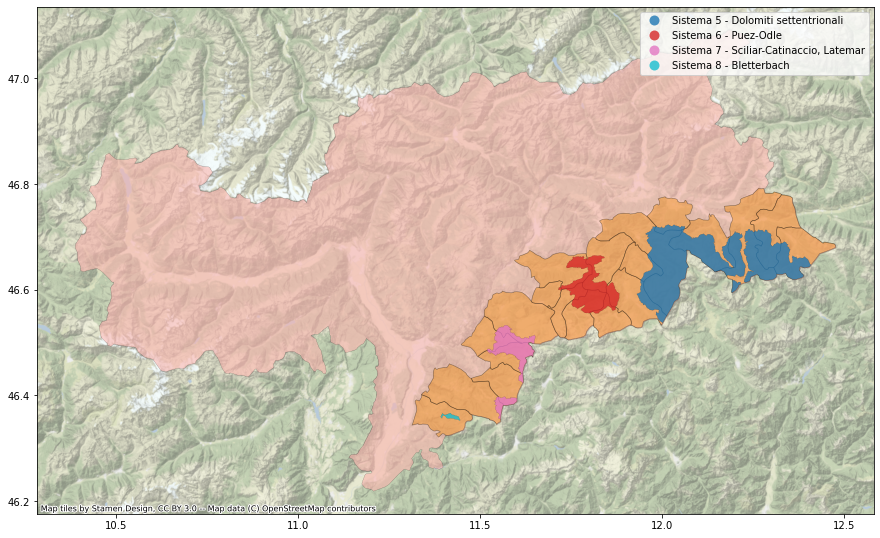

In [149]:
base = province_BZ.to_crs(epsg=4326).plot(
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.6
    )
ctx.add_basemap(base, zoom=12, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)

geo_dolomiti_BZ_mun.plot(
    ax=base,
    color="#F18701",
    alpha=0.4,
    edgecolor="k",
    lw=0.6
)

dolomities_BZ_clipped.plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.80,
    lw=0.1
    )


### Get the data about ski runs in the province of Bolzano

We downloaded the the ski runs' data from province's [Open Data Portal](https://data.civis.bz.it/it/dataset/registro-provinciale-delle-piste-da-sci/resource/65dcce0c-9866-4dae-97d8-50c251a88bc5).

We read this data:

In [150]:
ski_slopes_path = "data\Ski_slopes_data"
ski_slopes_BZ = gpd.read_file(ski_slopes_path)
ski_slopes_BZ = ski_slopes_BZ.to_crs(epsg=4326)
ski_slopes_BZ.head(5)

,OBJECTID,SKIKEY,PLR,SKIZONE,NAME_IT,NAME_DE,PERIMETER,AREA,SHAPE,geometry
0,19760.0,10.05,10.0,5.0,Danterceppies-Passo Gardena,Danterceppies-Grödnerjoch,642.11,1636.67,None,"POLYGON ((11.75878 46.55751, 11.75879 46.55752..."
1,19761.0,15.02,15.0,2.0,Gardenaccia,Gardenaccia,10772.65,231688.60,None,"POLYGON ((11.90036 46.59903, 11.90042 46.59897..."
2,19762.0,14.01,14.0,1.0,Plan de corones,Kronplatz,1494.77,80420.69,None,"POLYGON ((12.00861 46.74494, 12.00833 46.74483..."
3,19763.0,11.13,11.0,13.0,Filler,Filler,2707.28,186099.19,None,"POLYGON ((11.71263 46.64093, 11.71259 46.64121..."
4,19794.0,15.01,15.0,1.0,Corvara-Badia,Corvara-Abtei,1564.08,18155.70,None,"POLYGON ((11.90192 46.58137, 11.90190 46.58137..."


What kind of geometry are we dealing with?

In [151]:
ski_slopes_BZ.geom_type.unique()

array(['Polygon'], dtype=object)

The geometry of the ski slopes data is Polygon.

Plot the data:

<AxesSubplot:>

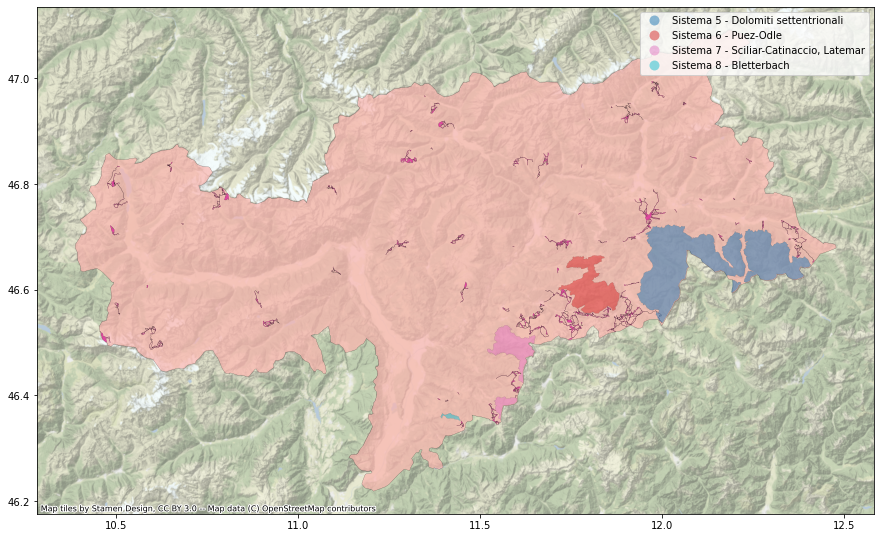

In [152]:
base = province_BZ.to_crs(epsg=4326).plot(
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.7
    )
ctx.add_basemap(base, zoom=12, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)

ski_slopes_BZ.plot(
    ax=base,
    color="#E0479E",
    edgecolor="k",
    alpha=1,
    lw=0.1,
    )

dolomities_BZ_clipped.plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.5,
    lw=0.1,
    )



#### How many kilometres of ski slopes does the province have?

In [153]:
# sum AREA column to obtain the whole ski slopes' area
ski_slopes_BZ_total_area = sum(ski_slopes_BZ.AREA)
print("Province of Bolzano has ", round((ski_slopes_BZ_total_area/10**6), 2), " km\u00b2 of ski slopes.", sep="")

Province of Bolzano has 43.89 km² of ski slopes.


### Get the data about ski lifts and cableways in province of Bolzano

We downloaded the the ski lifts' data from province's [Open Data Portal](https://data.civis.bz.it/it/dataset/registro-provinciale-degli-impianti-di-risalita/resource/998ed1fe-3a09-4531-a404-c2103a1c52df).

We read this data:

In [154]:
ski_lifts_path = "data\Ski_lifts_data"
ski_lifts_BZ = gpd.read_file(ski_lifts_path)
ski_lifts_BZ = ski_lifts_BZ.to_crs(epsg=4326)
ski_lifts_BZ.head(5)

,OBJECTID,SKIKEY,PLR,SKIZONE,NAME_IT,NAME_DE,LENGTH,SHAPE,geometry
0,68881.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,1709.12,None,"LINESTRING (11.76168 46.55321, 11.76147 46.552..."
1,68882.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,1324.90,None,"LINESTRING (11.76480 46.54955, 11.76470 46.549..."
2,68883.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,1557.53,None,"LINESTRING (11.77135 46.53253, 11.76029 46.527..."
3,68884.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,970.85,None,"LINESTRING (11.75888 46.52607, 11.75810 46.526..."
4,68885.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,547.47,None,"LINESTRING (11.76882 46.52285, 11.76833 46.523..."


What kind of geometry are we dealing with?

In [155]:
ski_lifts_BZ.geom_type.unique()

array(['LineString'], dtype=object)

We are dealing with Linestring in this case, which is intuitive since ski lifts are actually lines.

Plot province's ski lift together with ski slopes:

<AxesSubplot:>

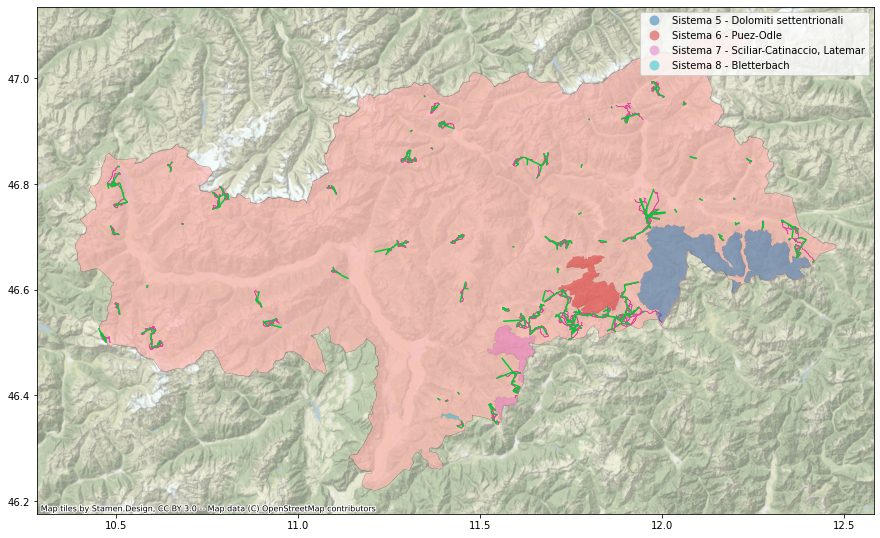

In [156]:
base = province_BZ.to_crs(epsg=4326).plot(
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.7
    )
ctx.add_basemap(base, zoom=12, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)

ski_lifts_BZ.plot(
    ax=base,
    color="#00CC33",
    edgecolor="#00CC33",
    alpha=1,
    )

ski_slopes_BZ.plot(
    ax=base,
    color="#E0479E",
    edgecolor="#E0479E",
    alpha=1,
    lw=0.6,
    )

dolomities_BZ_clipped.plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.5,
    lw=0.1,
    )

### Explore Dolomiti systems ski slopes and lifts

Clip ski slopes and lifts with Dolomiti municipalities boundaries in order to get only the ones includes in the Dolomiti area:

In [157]:
ski_slopes_BZ_clipped = ski_slopes_BZ.clip(geo_dolomiti_BZ_mun)
ski_lifts_BZ_clipped = ski_lifts_BZ.clip(geo_dolomiti_BZ_mun)

Recalculate Dolomiti ski runs area:

In [158]:
ski_slopes_dolomiti_mun_areas= ski_slopes_BZ_clipped.to_crs(epsg=32632)
ski_slopes_BZ_clipped["clipped_area"] = ski_slopes_dolomiti_mun_areas['geometry'].area

#### What proportion of ski runs does the Bolzano's Dolomiti area have?

In [159]:
ski_slopes_dolomiti_mun_total_area = sum(ski_slopes_BZ_clipped["clipped_area"])
percentage_ski_slopes = (ski_slopes_dolomiti_mun_total_area/ski_slopes_BZ_total_area)*100
print(round(percentage_ski_slopes,2), "% of ski runs area in province of Bolzano are within the Dolomiti's municipality.", sep="")

49.79% of ski runs area in province of Bolzano are within the Dolomiti's municipality.


The province's Dolomiti area has almost half of the ski runs of the entire province.

Plot the clipped ski lifts and ski runs:

In [160]:
# dissolve the Dolomiti municipalities borders
area_dolomiti_BZ = dissolve_province_dolomiti_area(21)

<AxesSubplot:>

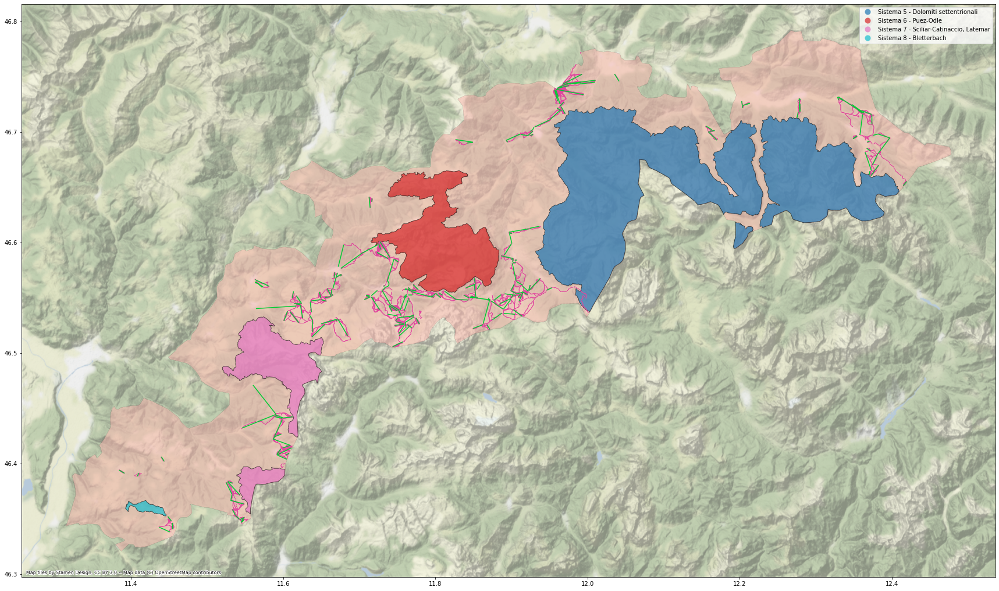

In [161]:
base = area_dolomiti_BZ.to_crs(epsg=4326).plot(
    figsize=(30,30),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.5
    )

ctx.add_basemap(base, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)


dolomities_BZ_clipped.to_crs(epsg=4326).plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.7,
    lw=0.8,
    )

ski_lifts_BZ_clipped.plot(
    ax=base,
    color="#00CC33",
    edgecolor="#00CC33",
    alpha=1,
    )

ski_slopes_BZ_clipped.plot(
    ax=base,
    color="#E0479E",
    edgecolor="#E0479E",
    alpha=1,
    lw=0.6,
    )


As we can see from the plot, the ski runs and ski lifts reach as far as the Domolites' foothills.

### How many hotels are there in the Bolzano's Dolomiti area?
#### Get the PBF for the province of Bolzano from [Wikimedia](https://osmit-estratti.wmcloud.org/)

Let us now investigate the tourist accommodation in the area, which can host skiers during their visit.

In [162]:
alto_adige_download_pbf_url = "https://osmit-estratti.wmcloud.org/dati/poly/province/pbf/021_Bolzano%20-%20Bozen_poly.osm.pbf"
# request the file
import requests
r = requests.get(alto_adige_download_pbf_url, allow_redirects=True)
# save the file
open('data/alto_adige.pbf', 'wb').write(r.content)

45784065

Check available tags:

In [163]:
osm = pyrosm.OSM("data/alto_adige.pbf")
osm.conf.tags.available

['aerialway',
 'aeroway',
 'amenity',
 'boundary',
 'building',
 'craft',
 'emergency',
 'geological',
 'highway',
 'historic',
 'landuse',
 'leisure',
 'natural',
 'office',
 'power',
 'public_transport',
 'railway',
 'route',
 'place',
 'shop',
 'tourism',
 'waterway']

Obtain turists accomodation and keep only the object within Dolomiti's area of the province:

In [164]:
# select tags of interest
turism_tag = [
    'alpine_hut',
    'apartment',
    'chalet',
    'guest_house',
    'hostel',
    'hotel']

# create the filter
custom_filter = {'tourism': turism_tag}

# get the points coresponding to the filter
tourist_accommodation = osm.get_pois(custom_filter=custom_filter)
# keep only points which are within the Dolomiti area
tourist_accommodation_clipped = tourist_accommodation[tourist_accommodation.within(area_dolomiti_BZ.geometry.values[0])]

#### How many tourists' accomodation are there in the area?

In [165]:
print("There are", len(tourist_accommodation_clipped), "tourist accomodation structures in the Dolomiti area.") 

There are 1368 tourist accomodation structures in the Dolomiti area.


Plot the tourist accommodation by type:

<AxesSubplot:>

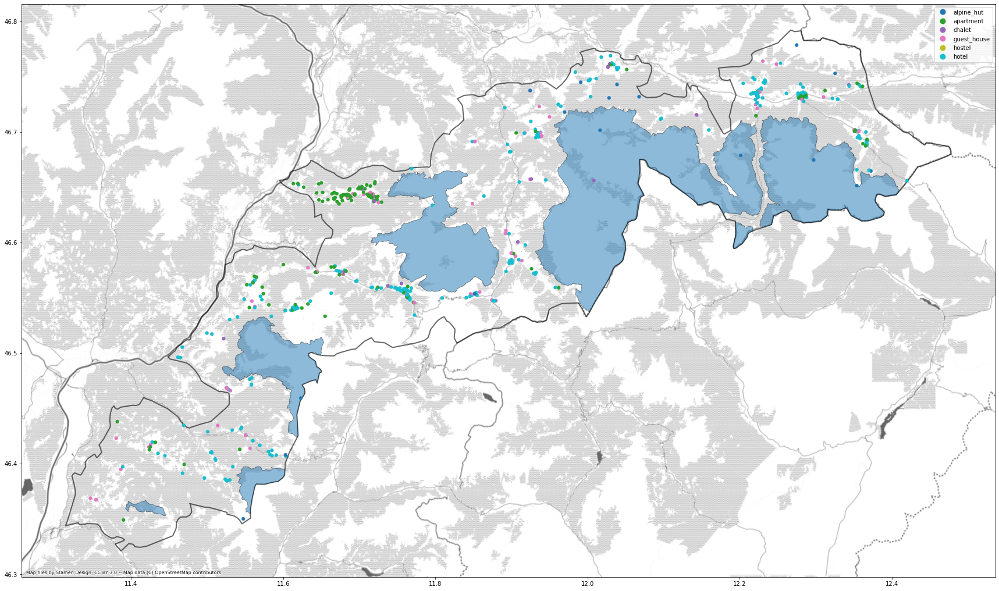

In [166]:

base = area_dolomiti_BZ.plot(
    figsize=(30,30),
    facecolor="none",
    edgecolor="k",
    alpha=0.6,
    lw=2,)

ctx.add_basemap(base, crs=area_dolomiti_BZ.crs.to_string(), source=ctx.providers.Stamen.TonerBackground, alpha=0.6)

dolomities_BZ_clipped.to_crs(epsg=4326).plot(
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.5,
    lw=0.8,
    )

tourist_accommodation_clipped.plot(
    column='tourism',
    categorical=True,
    legend=True,
    ax=base,
    marker='.',
    markersize=150,
    cmap="tab10",
    lw=0.1,
    )

### Which is the nearest accomodation for each ski area?
#### Caculate nearest accomodation for ski lift starting points (where users can start their skiing activities)

First we have to find ski lifts (Linestring) starting point:


In [167]:
import warnings
warnings.filterwarnings('ignore')

from shapely.geometry import Point

ski_lifts_BZ_clipped['starting_point'] = ""
for idx, row in ski_lifts_BZ_clipped.iterrows():
    # find Linestring's starting Point
    ski_lifts_BZ_clipped.loc[idx,'starting_point'] = Point(row.geometry.coords[0])

# create a new GeoDataFrame for the starting point    
ski_lifts_starting_point = ski_lifts_BZ_clipped
# reassign the geometry
ski_lifts_starting_point.geometry = ski_lifts_starting_point.starting_point

#### Is each ski lift correspond to a ski area (one or more ski slopes)?

In [168]:
ski_lifts_BZ_clipped.sort_values(by=['NAME_IT'], ascending=True).NAME_IT.unique() == ski_slopes_BZ_clipped.sort_values(by=['NAME_IT'], ascending=True).NAME_IT.unique()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

The name of ski lifts and ski slopes correspond. In fact, they represent the names of the ski areas, which consist of several ski slopes and lifts.

Plot ski lifts' starting points:

<AxesSubplot:>

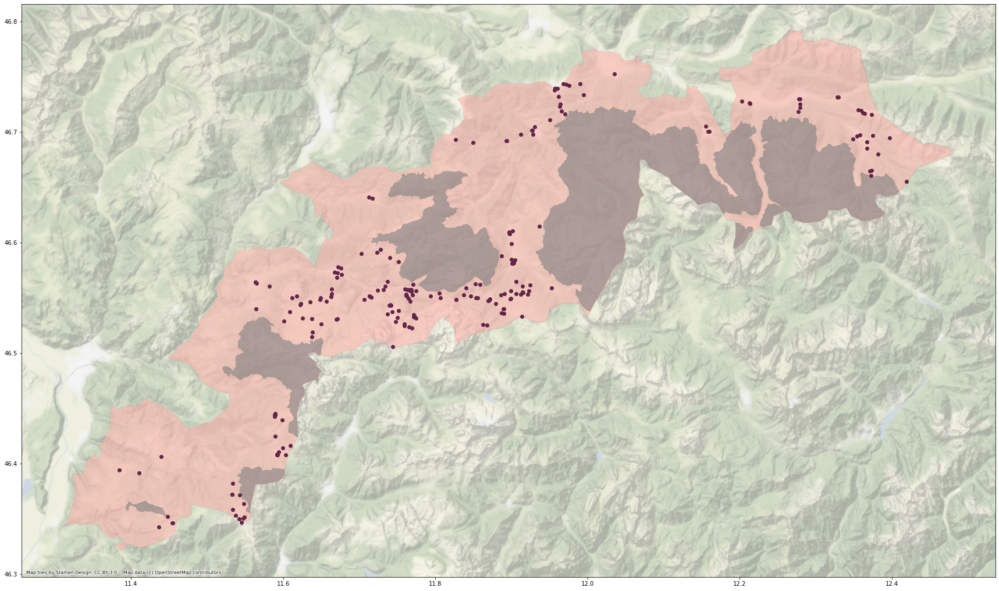

In [169]:
base = area_dolomiti_BZ.plot(
    figsize=(30,30),
    cmap='Pastel1',
    edgecolor="k",
    lw=0.1, 
    alpha=0.6
)

ctx.add_basemap(base, crs=area_dolomiti_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.5)


dolomities_BZ_clipped.plot(
    ax=base,
    color="grey",
    alpha=0.6
)

ski_lifts_starting_point.plot(
    ax=base, 
    color='#63264A',

)

Given the high number of ski lifts starting point, let's plot a cluster visualization with folium:

In [170]:
# add starting point lon and lat column 
ski_lifts_starting_point['longitude'] = ski_lifts_starting_point.geometry.x
ski_lifts_starting_point['latitude'] = ski_lifts_starting_point.geometry.y

In [171]:
from folium.plugins import MarkerCluster
# compose the starting map centering it on the ski lift point coordinates mean
map=folium.Map(location=[ski_lifts_starting_point.to_crs(epsg=4326).geometry.y.mean(), ski_lifts_starting_point.to_crs(epsg=4326).geometry.x.mean()], tiles='cartodbpositron', zoom_start=10)

# function to easily compose map's markers
def getMarker(lat,lon, message,tip,inconstyle):
      marker = folium.Marker(location=[lat,lon],
                         popup=message,
                         tooltip=tip,
                         icon=inconstyle)
      return marker

marker_cluster = MarkerCluster().add_to(map)

# base shape (Dolomiti area)
for _, r in area_dolomiti_BZ.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    geo_j.add_to(map)

# define ski lift marker and clusters
for index, row in ski_lifts_starting_point.iterrows():
  icon=folium.features.CustomIcon('https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/google/313/mountain-cableway_1f6a0.png',icon_size=(24,24))
  message = '<strong>ski lift ID:'+ str(row['OBJECTID']) + "</strong><br/>" + row['NAME_IT']
  tip = message + '<br/>' + row['NAME_DE']
  marker = getMarker(row['latitude'],row['longitude'],message, tip, icon) 
  # add to marker cluster 
  marker.add_to(marker_cluster)
map

Given their large number, we can do the same with tourist accomodation structures.

We first have to calculate the geometry centroid since some records have a Polygon geometry:

In [172]:
import warnings
warnings.simplefilter("ignore")

tourist_accommodation_clipped["centroid"] = tourist_accommodation_clipped.to_crs(epsg=32632).centroid

# we recompose these column from the centroid coordinate since the already present lat and lon column are null for some values
tourist_accommodation_clipped['latitude'] = tourist_accommodation_clipped.centroid.to_crs(epsg=4326).x
tourist_accommodation_clipped['longitude'] = tourist_accommodation_clipped.centroid.to_crs(epsg=4326).y

Reassign geometry:

In [173]:
tourist_accommodation_clipped = tourist_accommodation_clipped.drop(columns=['geometry'])
tourist_accommodation_clipped = tourist_accommodation_clipped.set_geometry('centroid').rename_geometry('geometry')
tourist_accommodation_clipped = tourist_accommodation_clipped.to_crs(epsg=4326)

In [174]:
# compose the starting map centering it on the ski lift point coordinates mean (in order to have the same centering as previous)
map=folium.Map(location=[ski_lifts_starting_point.to_crs(epsg=4326).geometry.y.mean(), ski_lifts_starting_point.to_crs(epsg=4326).geometry.x.mean()], tiles='cartodbpositron', zoom_start=10)

marker_cluster = MarkerCluster().add_to(map)

# base shape (Dolomiti area)
for _, r in area_dolomiti_BZ.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    geo_j.add_to(map)

# define tourist accomodation marker and clusters
for index, row in tourist_accommodation_clipped.iterrows():
  icon=folium.features.CustomIcon('https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/google/298/bed_1f6cf-fe0f.png',icon_size=(24,24))
  message = '<strong>OSM ID:'+ str(row['id']) + "</strong><br/>" + row['tourism']
  marker = getMarker(row['longitude'],row['latitude'],message, tip, icon)
  # add to marker cluster 
  marker.add_to(marker_cluster)
map

#### Calculate the nearest toutist accomodation for each ski lift starting point

We will create a function able to return the map of the path from the chosen starting point to the nearest tourist accomodation.

We first need to get the street network of the area using `networkx`:

In [175]:
# get nodes and edges from previous defined osm (alto_adige.PBF)
nodes, edges = osm.get_network(nodes=True)

# keep only nodes and edges that fall withing the area's borders
nodes = nodes[nodes.within(area_dolomiti_BZ.geometry.values[0])]
edges = edges[edges.within(area_dolomiti_BZ.geometry.values[0])]

# get the networkx graph with osmnx functions
G = osm.to_graph(nodes, edges, graph_type="networkx")
G = ox.add_edge_speeds(G)
G = ox.add_edge_travel_times(G)


The following function can calculate the path between two points: a chosen skilift starting point (identify by the OBJECTID) and the nearest type of accomodation chosen (identify by a tourism tag):

In [176]:
def nearest_accomodation_path(OBJECTID, type_of_turism):
      
      # estract chosen starting point
      starting_point = ski_lifts_starting_point[ski_lifts_starting_point.OBJECTID == OBJECTID]
      
      # if the starting point OBJECTID is not valid
      if len(starting_point) == 0:
            return print("The chosen starting point OBJECTID does not exist")
      else:
            
            # if the chosen type of turism is not valid
            if type_of_turism not in tourist_accommodation_clipped.tourism.values:
                return print("The chosen type of accomodation does not exist")
            else:
                  
                # estract chosen type of turism
                tourist_accommodation_clipped_selected = tourist_accommodation_clipped[tourist_accommodation_clipped.tourism == type_of_turism]
                # extract tourist accomodation geometry for the near() function
                tourist_accommodation_geom = tourist_accommodation_clipped_selected.geometry.unary_union
                
                # function to get the nearest chosen accomodation from the chosen ski starting point
                def near(point, pts=tourist_accommodation_geom):
                      
                       from shapely.ops import nearest_points
                       # find the nearest point (using nearest_points()) and return the corresponding accomodation id value
                       nearest = tourist_accommodation_clipped_selected.geometry == nearest_points(point, pts)[1]
                       return tourist_accommodation_clipped_selected[nearest].id.values[0]
                 
                # apply the function to starting_point GeoDataFrame
                starting_point['Nearest_torism_accomodation'] = starting_point.apply(lambda row: near(row.geometry), axis=1)
                nearest = starting_point.Nearest_torism_accomodation.values[0]
                  
                # extract nearest accomodation information from tourist_accommodation_clipped
                tourist_accommodation = tourist_accommodation_clipped[tourist_accommodation_clipped.id == nearest]
          
                # obtain ski starting point info
                starting_point_lat = starting_point.geometry.values.y[0]
                starting_point_lon = starting_point.geometry.values.x[0]
                starting_point_point = starting_point_lat, starting_point_lon
                
                # obtain nearest point on map
                nearest_point_starting_point = ox.get_nearest_node(G, starting_point_point)
                
                # obtain tourist_accomodation point info
                tourist_accommodation_lat = tourist_accommodation.longitude.values[0]
                tourist_accommodation_lon = tourist_accommodation.latitude.values[0]
                tourist_accommodation_point = tourist_accommodation_lat, tourist_accommodation_lon
                
                # obtain nearest point on map
                nearest_tourism_point = ox.get_nearest_node(G, tourist_accommodation_point)
                
                # calculate the shortest path between the two points
                route = ox.shortest_path(G, nearest_point_starting_point, nearest_tourism_point, weight='travel_time')
                
                # calculate the route duration
                import datetime
                edge_times = ox.utils_graph.get_route_edge_attributes(G, route, 'travel_time')
                seconds = sum(edge_times)
                route_time = str(datetime.timedelta(seconds=seconds))
                
                # print route duration information
                print("From cableway ", starting_point.NAME_IT.values[0], " (id: ",starting_point.OBJECTID.values[0], ") to the nearest ", type_of_turism, " the route takes ", route_time, " minutes ", sep="")
                
                # build a starting folium map with the route
                map = ox.plot_route_folium(G, route, popup_attribute='name', tiles='OpenStreetMap', route_color="#0C8346")
                
                # add tourist accomodation's marks to the map
                for idx, row in tourist_accommodation.iterrows():
                  icon=folium.features.CustomIcon('https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/google/298/bed_1f6cf-fe0f.png',icon_size=(30,30))
                  message = '<strong>OSM ID:'+ str(row['id']) + "</strong><br/>" + row['tourism']
                  tip = message + '<br/>'
                  marker = getMarker(row['longitude'],row['latitude'],message, tip, icon)
                  marker.add_to(map)
                  
                # add ski starting point's marks to the map
                for idx, row in starting_point.iterrows():
                  icon=folium.features.CustomIcon('https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/google/313/mountain-cableway_1f6a0.png',icon_size=(24,24))
                  message = '<strong>ski lift ID:'+ str(row['OBJECTID']) + "</strong><br/>" + row['NAME_IT']
                  tip = message + '<br/>' + row['NAME_DE']
                  marker = getMarker(row['latitude'],row['longitude'],message, tip, icon) 
                  marker.add_to(map)
                
                # return the map  
                return map

For example: *we want to go skiing in the Secceda resort (we can see the possible ski lift starting point OBJECTID from the previous cluster visualization) and we want to find the closest **apartment** to the selected starting point*:

In [179]:
nearest_accomodation_path(69064.0, "apartment")

From cableway Seceda (id: 69064.0) to the nearest apartment the route takes 0:00:35.900000 minutes 


*What if we wanted to stay in a more suggestive location such as an **alpine hut**?*

In [178]:
nearest_accomodation_path(69064.0, "alpine_hut")

From cableway Seceda (id: 69064.0) to the nearest alpine_hut the route takes 0:04:49.200000 minutes 


Note that we could have had the same result by directly calculating the shortest paths between the chosen ski lift starting point and all tourist accommodations (of the chosen type) and taking the shortest route. Extracting the nearest network points for each tourist accommodation (using `ox.get_nearest_node()`) and calculating all shortest paths with the starting point (using `ox.shortest_path()`) is in fact resource demanding. For this reason, in the construction of the function, it was decided to first find the closest tourist accommodation to the chosen starting point and to compute only the shortest path between them.